# Assignment 3

Solve the 1D shock tube problem based on the problem statement given in the PDF.


In [26]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from numba import jit, njit
import time

In [2]:
@njit
def cubic_spline(xij,h):
    rij = abs(xij)
    q = rij/h
    a = 2/(3*h)
    if q<=1:
        return a*(1-(1.5*(q**2)*(1-0.5*q)))
    elif q<=2:
        return 0.25*a*(2-q)**3
    elif q>2:
        return 0

@njit
def cubic_spline_derivative(xij,h):
    rij = abs(xij)
    q = rij/h
    a = 2/(3*h)
    if q<=1:
        if not xij ==0 :
            return -1.5*a*((-(0.5*q**2)/h)+(2*q/h)*(1-0.5*q))*(abs(xij)/xij)
        else :
            return 0
    elif q<=2:
        if not xij==0:
            return (-0.75*a/h*(2-q)**2)*(abs(xij)/xij)
        else:
            return 0
    elif q>2:
        return 0


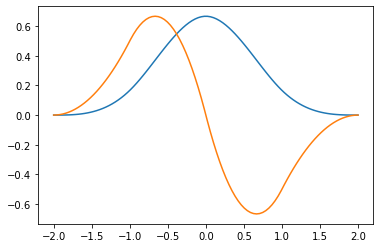

In [3]:
x = np.linspace(-2,2,100)
result = []
resultd = []
for i in x:
    result.append(cubic_spline(i,1))
    resultd.append(cubic_spline_derivative(i,1))

plt.plot(x,result)
plt.plot(x,resultd)

In [4]:
@njit
def EOS(e,rho):
    gamma = 1.4
    p = (gamma-1)*rho*e
    return p

@njit(parallel=True)
def integrate(intial,dt,r_change):
    final = intial+dt*r_change
    return final

In [10]:
@njit
def continuity_eqaution(rho,m,v,h,x,dt,idx):
    arho = np.zeros_like(rho)
    for a in range(len(m)):
        s = 0
        for b in range(len(m)):
            xab = x[a]-x[b]
#             s+=(m[b]/rho[b])*(v[a]-v[b])*(cubic_spline_derivative(xab,(h[a]+h[b])*0.5))
#             s+=(m[b])*(v[a]-v[b])*(cubic_spline_derivative(xab,(h[a]+h[b])*0.5))

#         arho[a]= rho[a]*s
#         arho[a]= s

            s+=m[b]*cubic_spline(xab,(h[a]+h[b])*0.5)
        arho[a] = s
        
#     rho_updated = integrate(rho,dt,arho)
    rho_updated = arho
    return rho_updated



In [11]:
@njit
def artificial_viscosity(xab,vab,rhoab,cab,hab):
    eta = 0.1*hab
    if vab*xab<0:
        muab = hab*vab*xab/(abs(xab)**2+eta**2)
        piab = (-cab*muab + muab**2)/rhoab
        return piab
    else:
        return 0

@njit(parallel=True)
def momentum_equation(rho,m,x,p,v,c,h,dt,idx):
    acc = np.zeros_like(m)
    for a in range(len(m)):
        s = 0
        for b in range(len(m)):
            xab = x[a]-x[b]
            vab = v[a]-v[b]
            rhoab = (rho[a]+rho[b])*0.5
            cab = (c[a]+c[b])*0.5 

            hab = (h[a]+h[b])*0.5
            
            s+=(m[b])*((p[a]/rho[a]**2)+(p[b]/rho[b]**2)+artificial_viscosity(xab,vab,rhoab,cab,hab))*(cubic_spline_derivative(xab,(h[a]+h[b])*0.5))

        acc[a] = -1*s

    vel_updated = integrate(v,dt,acc)

    x_updated = integrate(x,dt,v)

    return vel_updated, x_updated


In [12]:
@njit
def energy_equation(rho,m,x,p,v,c,h,dt,e,idx):
    ae = np.zeros_like(m)
    for a in range(len(m)):
        s = 0
        for b in range(len(m)):
            xab = x[a]-x[b]
            vab = v[a]-v[b]
            rhoab = (rho[a]+rho[b])*0.5
            cab = (c[a]+c[b])*0.5

            hab = (h[a]+h[b])*0.5
            s+=(m[b])*((p[a]/rho[a]**2)+(p[b]/rho[b]**2)+artificial_viscosity(xab,vab,rhoab,cab,hab))* \
                        (cubic_spline_derivative(xab,(h[a]+h[b])*0.5))*vab
#             if np.isnan(s):
#                 print(artificial_viscosity(xab,vab,rhoab,cab,hab))
        ae[a] = 0.5*s
    e_updated = integrate(e,dt,ae)

#     for i in range(len(e_updated)):
#         if e_updated[i]<0:
#             print(i,idx)
    return e_updated

In [13]:

def create_particles(xmin,xmax,dx1,dx2):
    x1 = np.arange(xmin,0,dx1)
    x2 = np.arange(0,xmax,dx2)
    return x1,x2

@njit(parallel=True)
def intialize(x1,x2,dx1,dx2):
    rho1 = np.ones_like(x1)
    rho2 = np.ones_like(x2)*0.125
    rho = np.concatenate((rho1,rho2))

    p1 = np.ones_like(x1)
    p2 = np.ones_like(x2)*0.1
    p = np.concatenate((p1,p2))

    v1 = np.zeros_like(x1)
    v2 = np.zeros_like(x2)
    v = np.concatenate((v1,v2))

    h1 = 2*np.ones_like(x1)*dx1
    h2 = 2*np.ones_like(x2)*dx2
    h = np.concatenate((h1,h2))

    e = p/(rho*0.4)
    x = np.concatenate((x1,x2))
    return rho,p,v,h,e,x


8e-05 0


/home/amalss18/.local/lib/python3.6/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "<ipython-input-11-7a67c767662b>", line 12:
@njit(parallel=True)
def momentum_equation(rho,m,x,p,v,c,h,dt,idx):
^

  self.func_ir.loc))


0.00016 1
0.00024000000000000003 2
0.00032 3
0.0004 4
0.00048 5
0.0005600000000000001 6
0.00064 7
0.00072 8
0.0008 9
0.00088 10
0.00096 11
0.0010400000000000001 12
0.0011200000000000001 13
0.0012000000000000001 14
0.00128 15
0.00136 16
0.00144 17
0.00152 18
0.0016 19
0.00168 20
0.00176 21
0.00184 22
0.00192 23
0.0020000000000000005 24
0.0020800000000000003 25
0.0021600000000000005 26
0.0022400000000000002 27
0.0023200000000000004 28
0.0024000000000000002 29
0.0024800000000000004 30
0.00256 31
0.0026400000000000004 32
0.0027200000000000006 33
0.0028000000000000004 34
0.0028800000000000006 35
0.0029600000000000004 36
0.0030400000000000006 37
0.0031200000000000004 38
0.0032000000000000006 39
0.0032800000000000004 40
0.0033600000000000006 41
0.0034400000000000003 42
0.0035200000000000006 43
0.0036000000000000003 44
0.0036800000000000005 45
0.0037600000000000003 46
0.0038400000000000005 47
0.003920000000000001 48
0.004000000000000001 49
0.00408 50
0.0041600000000000005 51
0.0042400000000000

0.03944 492
0.03952 493
0.0396 494
0.03968 495
0.03976 496
0.03984 497
0.03992 498
0.04 499
0.04008 500
0.04016 501
0.04024 502
0.04032 503
0.0404 504
0.04048 505
0.04056 506
0.04064 507
0.04072 508
0.0408 509
0.04088 510
0.04096 511
0.04104 512
0.04112 513
0.0412 514
0.04128 515
0.04136 516
0.04144 517
0.04152 518
0.0416 519
0.04168 520
0.04176 521
0.04184 522
0.04192 523
0.042 524
0.04208 525
0.04216 526
0.04224 527
0.04232 528
0.0424 529
0.04248 530
0.04256 531
0.04264 532
0.04272 533
0.0428 534
0.04288 535
0.04296 536
0.04304 537
0.04312 538
0.0432 539
0.04328 540
0.04336 541
0.04344 542
0.04352 543
0.0436 544
0.043680000000000004 545
0.04376 546
0.04384 547
0.04392 548
0.044 549
0.04408 550
0.04416 551
0.04424 552
0.04432 553
0.0444 554
0.04448 555
0.04456 556
0.04464 557
0.04472 558
0.0448 559
0.04488 560
0.04496 561
0.045040000000000004 562
0.04512 563
0.0452 564
0.04528 565
0.04536 566
0.04544 567
0.04552 568
0.0456 569
0.04568 570
0.04576 571
0.04584 572
0.04592 573
0.046 574


0.09072000000000001 1133
0.0908 1134
0.09088 1135
0.09096 1136
0.09104000000000001 1137
0.09112 1138
0.0912 1139
0.09128 1140
0.09136000000000001 1141
0.09144000000000001 1142
0.09152 1143
0.0916 1144
0.09168 1145
0.09176000000000001 1146
0.09184 1147
0.09192 1148
0.092 1149
0.09208000000000001 1150
0.09216 1151
0.09224 1152
0.09232 1153
0.09240000000000001 1154
0.09248 1155
0.09256 1156
0.09264 1157
0.09272000000000001 1158
0.09280000000000001 1159
0.09288 1160
0.09296 1161
0.09304 1162
0.09312000000000001 1163
0.0932 1164
0.09328 1165
0.09336 1166
0.09344000000000001 1167
0.09352 1168
0.0936 1169
0.09368 1170
0.09376000000000001 1171
0.09384 1172
0.09392 1173
0.094 1174
0.09408000000000001 1175
0.09416000000000001 1176
0.09424 1177
0.09432 1178
0.0944 1179
0.09448000000000001 1180
0.09456 1181
0.09464 1182
0.09472 1183
0.09480000000000001 1184
0.09488 1185
0.09496 1186
0.09504 1187
0.09512000000000001 1188
0.0952 1189
0.09528 1190
0.09536 1191
0.09544000000000001 1192
0.0955200000000

0.13088 1635
0.13096000000000002 1636
0.13104000000000002 1637
0.13112000000000001 1638
0.1312 1639
0.13128 1640
0.13136 1641
0.13144 1642
0.13152 1643
0.1316 1644
0.13168000000000002 1645
0.13176000000000002 1646
0.13184 1647
0.13192 1648
0.132 1649
0.13208 1650
0.13216 1651
0.13224 1652
0.13232000000000002 1653
0.13240000000000002 1654
0.13248000000000001 1655
0.13256 1656
0.13264 1657
0.13272 1658
0.1328 1659
0.13288 1660
0.13296 1661
0.13304000000000002 1662
0.13312000000000002 1663
0.1332 1664
0.13328 1665
0.13336 1666
0.13344 1667
0.13352 1668
0.1336 1669
0.13368000000000002 1670
0.13376000000000002 1671
0.13384000000000001 1672
0.13392 1673
0.134 1674
0.13408 1675
0.13416 1676
0.13424 1677
0.13432 1678
0.13440000000000002 1679
0.13448000000000002 1680
0.13456 1681
0.13464 1682
0.13472 1683
0.1348 1684
0.13488 1685
0.13496 1686
0.13504000000000002 1687
0.13512000000000002 1688
0.13520000000000001 1689
0.13528 1690
0.13536 1691
0.13544 1692
0.13552 1693
0.1356 1694
0.13568 1695
0.

0.17168 2145
0.17176000000000002 2146
0.17184000000000002 2147
0.17192000000000002 2148
0.17200000000000001 2149
0.17208 2150
0.17216 2151
0.17224 2152
0.17232 2153
0.1724 2154
0.17248000000000002 2155
0.17256000000000002 2156
0.17264000000000002 2157
0.17272 2158
0.1728 2159
0.17288 2160
0.17296 2161
0.17304 2162
0.17312000000000002 2163
0.17320000000000002 2164
0.17328000000000002 2165
0.17336000000000001 2166
0.17344 2167
0.17352 2168
0.1736 2169
0.17368 2170
0.17376 2171
0.17384000000000002 2172
0.17392000000000002 2173
0.17400000000000002 2174
0.17408 2175
0.17416 2176
0.17424 2177
0.17432 2178
0.1744 2179
0.17448000000000002 2180
0.17456000000000002 2181
0.17464000000000002 2182
0.17472000000000001 2183
0.1748 2184
0.17488 2185
0.17496 2186
0.17504 2187
0.17512 2188
0.17520000000000002 2189
0.17528000000000002 2190
0.17536000000000002 2191
0.17544 2192
0.17552 2193
0.1756 2194
0.17568 2195
0.17576 2196
0.17584000000000002 2197
0.17592000000000002 2198
0.17600000000000002 2199
0.1

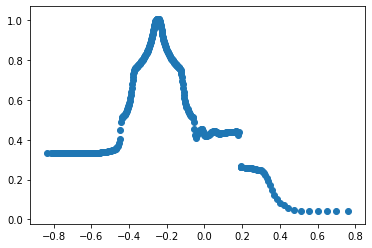

In [14]:
xmin, xmax= -0.5,0.5
dx1, dx2 = 0.0015625,0.0125
x1, x2 = create_particles(xmin,xmax,dx1,dx2)

tf = 0.2
dt = 0.8e-4


l = len(x1)+len(x2)
n = int(tf/dt)+1

p_hist = np.zeros((n,l))
rho_hist = np.zeros((n,l))
v_hist = np.zeros((n,l))
x_hist = np.zeros((n,l))
e_hist = np.zeros((n,l))
m = np.zeros(l)

rho_hist[0], p_hist[0], v_hist[0], h, e_hist[0], x_hist[0] = intialize(x1,x2,dx1,dx2)

for i in range(l):
    if i<len(x1):
        m[i] = rho_hist[0][i]*dx1
    else:
        m[i] = rho_hist[0][i]*dx2

time = np.arange(0,tf,dt)
time = time+dt

for i in range(n-1):
    print(time[i],i)
    c = np.sqrt(0.4*e_hist[i])
    p_hist[i+1] = EOS(e_hist[i],rho_hist[i])
    rho_hist[i+1] = continuity_eqaution(rho_hist[i],m,v_hist[i],h,x_hist[i],dt,i)
    v_hist[i+1], x_hist[i+1] = momentum_equation(rho_hist[i],m,x_hist[i],p_hist[i],v_hist[i],c,h,dt,i)
    e_hist[i+1] = energy_equation(rho_hist[i],m,x_hist[i],p_hist[i],v_hist[i],c,h,dt,e_hist[i],i)
    


plt.scatter(x_hist[-1],rho_hist[-1])
plt.show()



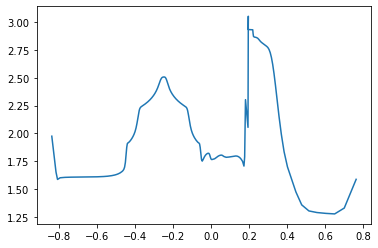

In [15]:
plt.plot(x_hist[-1],e_hist[-1])

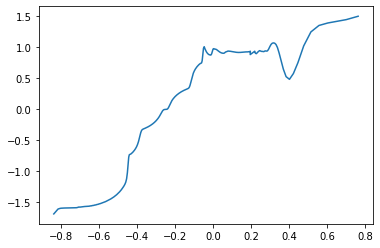

In [16]:
plt.plot(x_hist[-1],v_hist[-1])

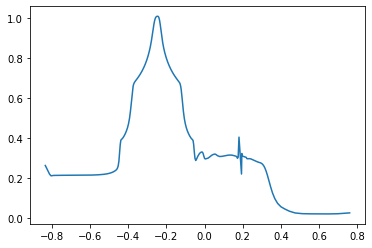

In [17]:
plt.plot(x_hist[-1],p_hist[-1])

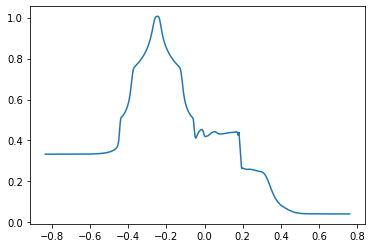

In [18]:
plt.plot(x_hist[-1],rho_hist[-1])

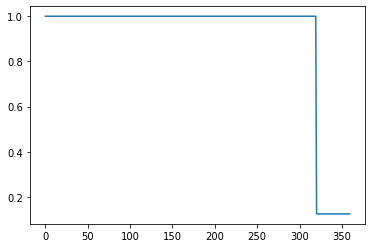

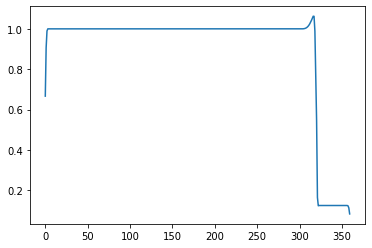

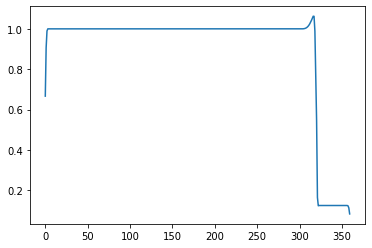

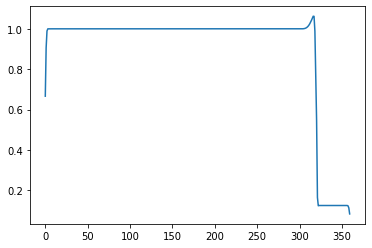

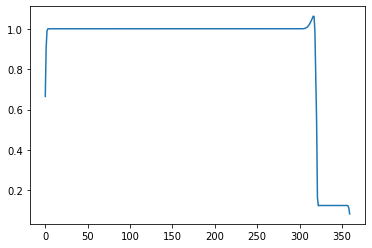

...

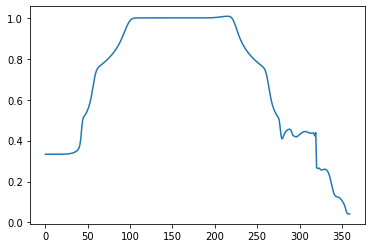

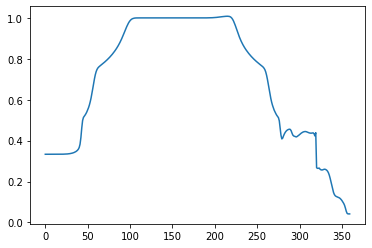

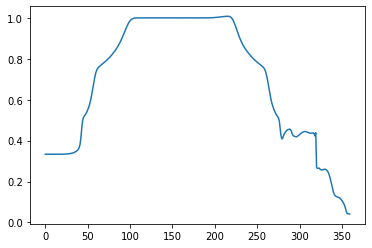

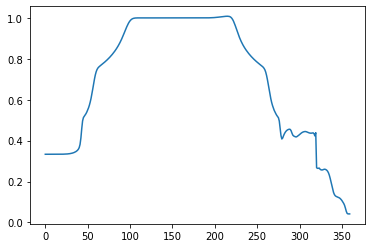

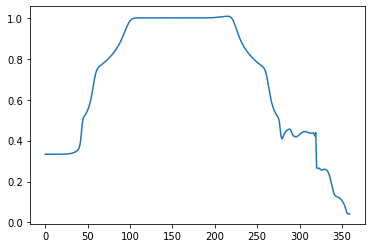

In [ ]:
for i in range(rho_hist.shape[0]):
    plt.plot(rho_hist[i])
    plt.show()
    time.sleep(0.1)
    plt.clf()